In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
data=pd.read_csv("Cognifyz_Restaurant_Dataset.csv",skipinitialspace=True)

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

In [4]:
from sklearn.preprocessing import LabelEncoder

In [5]:
encoder=LabelEncoder()

In [6]:
obj=data.select_dtypes(include=["object"])

In [7]:
for i in obj:
    data[i]=encoder.fit_transform(data[i])

In [8]:
data.describe()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
count,9.551000e+03,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.00000,...,9551.000000,9551.000000,9551.000000,9551.000000,9551.0,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000
mean,9.051128e+06,3653.079154,18.365616,78.301434,4542.439430,658.128678,677.305204,64.126574,25.854381,989.95079,...,3.977699,0.121244,0.256622,0.003560,0.0,1.804837,2.666370,2.952885,1.788713,156.909748
std,8.791521e+06,2143.025916,56.750546,23.198915,2565.717005,315.866877,331.727817,41.467058,11.007935,514.72354,...,0.914242,0.326428,0.436792,0.059561,0.0,0.905609,1.516378,1.493048,1.694637,430.169145
min,5.300000e+01,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,-157.948486,-41.330428,0.00000,...,0.000000,0.000000,0.000000,0.000000,0.0,1.000000,0.000000,0.000000,0.000000,0.000000
25%,3.019625e+05,1777.500000,1.000000,76.000000,2323.500000,381.000000,387.000000,77.081343,28.478713,497.00000,...,4.000000,0.000000,0.000000,0.000000,0.0,1.000000,2.500000,2.000000,0.000000,5.000000
50%,6.004089e+06,3595.000000,1.000000,88.000000,4610.000000,696.000000,707.000000,77.191964,28.570469,1127.00000,...,4.000000,0.000000,0.000000,0.000000,0.0,2.000000,3.200000,2.000000,2.000000,31.000000
75%,1.835229e+07,5485.500000,1.000000,88.000000,6746.500000,921.000000,953.000000,77.282006,28.642758,1355.00000,...,4.000000,0.000000,1.000000,0.000000,0.0,2.000000,3.700000,4.000000,3.000000,131.000000
max,1.850065e+07,7445.000000,216.000000,140.000000,8917.000000,1207.000000,1264.000000,174.832089,55.976980,1825.00000,...,11.000000,1.000000,1.000000,1.000000,0.0,4.000000,4.900000,5.000000,5.000000,10934.000000


<Axes: xlabel='Longitude', ylabel='Latitude'>

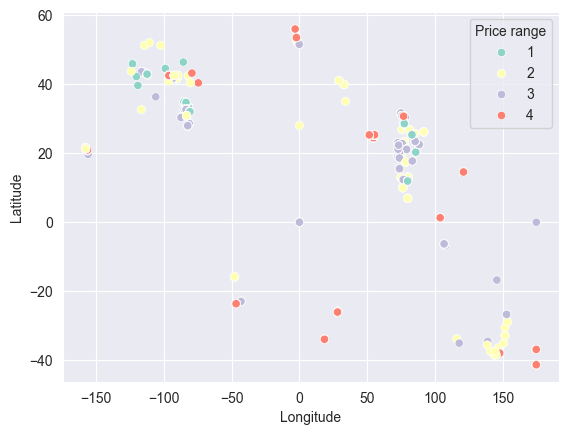

In [9]:
sns.set_style('darkgrid')
sns.scatterplot(x=data['Longitude'],y=data['Latitude'],hue=data['Price range'],palette='Set3')


<Axes: xlabel='Restaurant Name', ylabel='Longitude'>

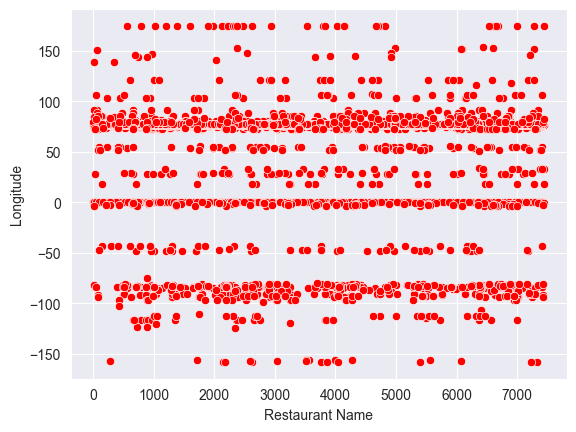

In [10]:
sns.scatterplot(x=data['Restaurant Name'],y=data['Longitude'],color='r')

<Axes: xlabel='Longitude', ylabel='Density'>

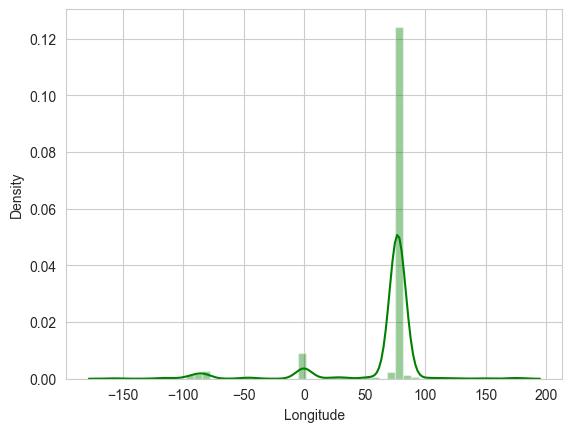

In [11]:
sns.set_style("whitegrid")
sns.distplot(data['Longitude'],color='green')

<Axes: xlabel='Latitude', ylabel='Density'>

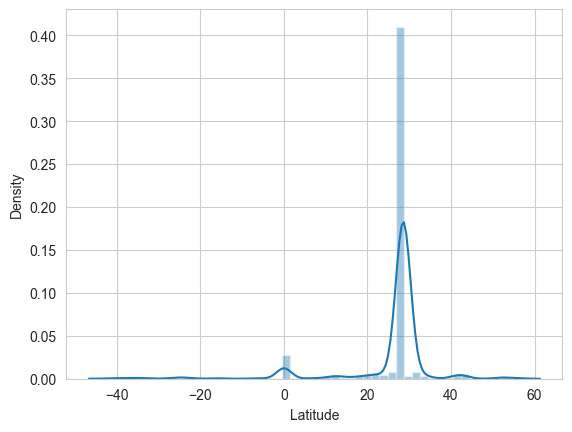

In [12]:
sns.distplot(data['Latitude'])

In [14]:
# visualizing with folium for interactive mapping of restaurant location
import folium

In [15]:
# creating real longitude/latitude map  
Rmap=folium.Map(location=[data['Latitude'].mean(), data['Longitude'].mean()],Zoom=3)

In [16]:
# Displaying the cordinates of the Restaurants
for idx, row in data.iterrows():
    folium.Marker(
        location=[row["Latitude"], row["Longitude"]],
        popup=row["Restaurant Name"],
        icon=folium.Icon(color="blue", icon="info-sign")
    ).add_to(Rmap)
Rmap